<a href="https://colab.research.google.com/github/kanitha180/Flower-Classification/blob/main/Another_copy_of_dl_demo_flower_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**FLOWER** **CLASSIFICATION** - **CNN**

### **DATASET**

* The Flower dataset is an image classification dataset containing **13,744 flower images**.
* Each image belongs to **one of 14 different flower categories**.
* The dataset contains flower images such as **Carnation, Iris, Bellflower, California Poppy, Rose, Astilbe, Tulip, Calendula, Dandelion, Coreopsis, Black-eyed Susan, Water Lily, Sunflower, and Common Daisy**.
* The dataset is used for training and evaluating a deep learning image classification model.

**MODEL**

* A **Convolutional Neural Network (CNN)** is used to automatically learn image features and classify flowers into their respective categories.
* The model consists of **convolution, pooling, and fully connected layers**, and is trained using the Flower dataset.


# **TASK 1**

**IMPORT LIBRARIES**

In [ ]:


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

print("Libraries imported successfully!")

Libraries imported successfully!


**EXPLANATION**

The required libraries are imported for data handling, image visualization, CNN model building, preprocessing, and model evaluation.

# **TASK 2**

**LOAD FLOWER DATASET**

In [ ]:
# Load Flower Dataset

import zipfile
import os
import pandas as pd
;
zip_path = "/content/archive.zip new.zip"
extract_path = "/content/flower_dataset"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Load CSV
train_df = pd.read_csv(os.path.join(extract_path, "train.csv"))

# Load class names
with open(os.path.join(extract_path, "classname.txt"), "r") as f:
    CLASS_NAMES = [line.strip() for line in f.readlines()]

print("Full dataset:", train_df.shape)
print("Number of classes:", len(CLASS_NAMES))
print("Classes:", CLASS_NAMES)
print("First 5 records:")
print(train_df.head())

Full dataset: (13642, 2)
Number of classes: 14
Classes: ['康乃馨', '鸢尾花', '风铃草', '金英花', '玫瑰', '落新妇', '郁金香', '金盏花', '蒲公英', '金鸡菊', '黑眼菊', '睡莲', '向日葵', '雏菊']
First 5 records:
                                     image:FILE  category
0   train/carnation/6838762136_f8254d6a1a_c.jpg         0
1   train/carnation/3540544866_823aee81af_c.jpg         0
2  train/carnation/50034862576_b0f55b7b3b_c.jpg         0
3  train/carnation/26770795691_f662e47143_c.jpg         0
4  train/carnation/18224456534_2f75191d85_c.jpg         0


**EXPLANATION**

The ZIP file is extracted to access the flower images and dataset files

# **TASK 3**

**DATA TRANSFORMATION**

In [ ]:
# Dataset Information

print("Number of Images:", len(train_df))
print("Number of Classes:", len(CLASS_NAMES))

print("\nClass Distribution:")
print(train_df.iloc[:, -1].value_counts())

Number of Images: 13642
Number of Classes: 14

Class Distribution:
category
1     1041
8     1038
9     1035
6     1034
3     1021
12    1013
7     1011
10     986
4      986
13     978
11     977
0      924
2      872
5      726
Name: count, dtype: int64


**EXPLANATION**



This step displays the total images, number of classes, and images available in each flower category.

# **TASK 4**

**TRAIN–VALIDATION DATA SPLIT**

In [ ]:


from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(
    train_df,
    test_size=0.1,
    stratify=train_df["category"],
    random_state=42
)

print("Train:", train_df.shape)
print("Validation:", val_df.shape)

print("\nTraining class distribution:")
print(train_df["category"].value_counts().sort_index())

Train: (12277, 2)
Validation: (1365, 2)

Training class distribution:
category
0     832
1     937
2     785
3     919
4     887
5     653
6     931
7     910
8     934
9     931
10    887
11    879
12    912
13    880
Name: count, dtype: int64


**EXPLANATION**

The dataset is split into training and validation sets while maintaining the class distribution

# **TASK 5**

**DATA VISUALIZATION**

In [ ]:
train_df["image_path"] = train_df["image:FILE"].apply(
    lambda x: os.path.join(extract_path, x)
)

val_df["image_path"] = val_df["image:FILE"].apply(
    lambda x: os.path.join(extract_path, x)
)

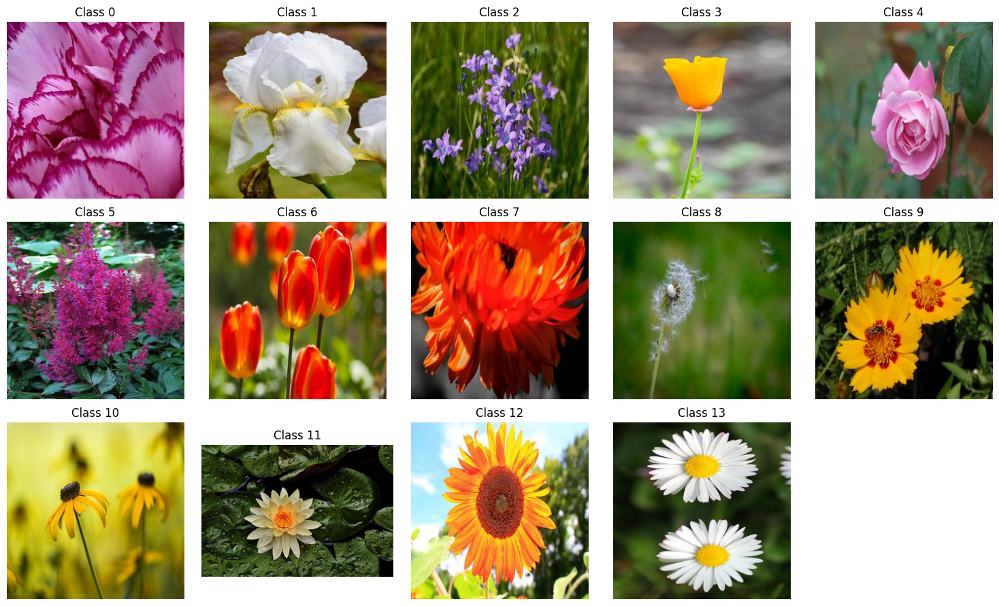

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

classes = list(range(14))

plt.figure(figsize=(15, 9))

for i, cls in enumerate(classes):

    row = train_df[train_df["category"].astype(int) == cls].iloc[0]

    img_path = row["image_path"]
    img = Image.open(img_path)

    plt.subplot(3, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Class {cls}")
    plt.axis("off")

plt.tight_layout()
plt.show()

**EXPLANATION**

This code creates the image paths and displays one sample image from each of the 14 flower classes for visualization

# **TASK 6**

**IMAGE PREPROCESSING**

In [ ]:
# Image Preprocessing

IMG_SIZE = (128, 128)
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    rescale=1./255
)

val_datagen = ImageDataGenerator(
    rescale=1./255
)

**EXPLANATION**

We resize the images to 128×128, process them in batches of 32, and normalize pixel values from 0–255 to 0–1

# **TASK 7**

**CREATE IMAGE GENERATOR**

In [ ]:
# Create Image Generators

from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_df["label"] = train_df["category"].astype(str)
val_df["label"] = val_df["category"].astype(str)

train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col="image_path",
    y_col="label",
    target_size=(128, 128),
    batch_size=32,
    class_mode="categorical",
    shuffle=True
)

validation_generator = val_datagen.flow_from_dataframe(
    val_df,
    x_col="image_path",
    y_col="label",
    target_size=(128, 128),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)

print("Generators created successfully!")

Found 12277 validated image filenames belonging to 14 classes.
Found 1365 validated image filenames belonging to 14 classes.
Generators created successfully!


**EXPLANATION**



The image file paths are created correctly for loading the flower images.

# **TASK 8**

**CNN MODEL ARCHITECTURE**

In [ ]:
# Build CNN Model

model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation="relu", input_shape=(128, 128, 3)),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation="relu"),
    layers.MaxPooling2D((2, 2)),

    layers.Flatten(),
    layers.Dense(128, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(14, activation="softmax")
])

model.summary()

/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 57600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     7,372,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 14)             │         1,806 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,394,126 (28.21 MB)

 Trainable params: 7,394,126 (28.21 MB)

 Non-trainable params: 0 (0.00 B)

**EXPLANATION**

The CNN learns image features using convolution and pooling layers and classifies the 14 flower categories.

# **TASK 9**

**COMPILE THE CNN MODEL**

In [ ]:
# Compile the CNN Model

model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

**EXPLANATION**

The CNN is configured with Adam optimizer, categorical cross-entropy loss, and accuracy as the evaluation metric.

We use **Adam optimizer** to train the model.
We use **categorical cross-entropy** to calculate the error.
And we use **accuracy** to check how correctly the model predicts the flower classes.



# **TASK 10**

**VISUALISING CNN ARCHITECTURE**

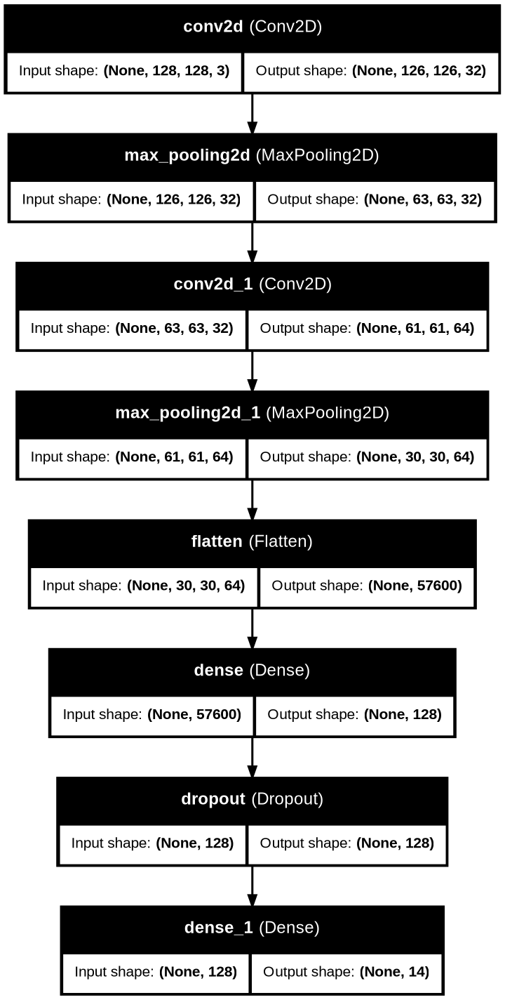

In [ ]:
# Visualize CNN Architecture

from tensorflow.keras.utils import plot_model
from IPython.display import Image as IPImage, display

plot_model(
    model,
    to_file="flower_cnn_architecture.png",
    show_shapes=True,
    show_layer_names=True,
    dpi=110
)

display(IPImage(filename="flower_cnn_architecture.png"))

**EXPLANATION**

**Next, we visualize the CNN architecture.**

This code creates a diagram of our CNN model.

It shows all the **layers of the model and their input and output shapes**.

The diagram helps us to **easily understand the structure and flow of the CNN model**.


# **TASK 11**

**TRAIN THE CNN MODEL**

In [ ]:
# Train the CNN Model

history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=10
)

Epoch 1/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 344s 894ms/step - accuracy: 0.8775 - loss: 0.3469 - val_accuracy: 0.6593 - val_loss: 1.3660
Epoch 2/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 334s 870ms/step - accuracy: 0.8860 - loss: 0.3165 - val_accuracy: 0.6447 - val_loss: 1.3972
Epoch 3/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 321s 836ms/step - accuracy: 0.8956 - loss: 0.2937 - val_accuracy: 0.6681 - val_loss: 1.3939
Epoch 4/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 323s 841ms/step - accuracy: 0.9041 - loss: 0.2621 - val_accuracy: 0.6659 - val_loss: 1.4470
Epoch 5/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 317s 826ms/step - accuracy: 0.9147 - loss: 0.2402 - val_accuracy: 0.6549 - val_loss: 1.5500
Epoch 6/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 328s 855ms/step - accuracy: 0.9229 - loss: 0.2163 - val_accuracy: 0.6645 - val_loss: 1.5374
Epoch 7/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 328s 855ms/step - accuracy: 0.9220 - loss: 0.2164 - val_accuracy: 0.6513 - val_loss: 1.5409
Epoch 8/10
384/384 ━━━━━━━━━━━━━━━━━━━━ 329s 857ms/step - accuracy: 0.9292 -

**EXPLANATION**

The CNN model is trained using the flower images for 10 epochs.

# **TASK 12**

**ACCURACY AND LOSS GRAPH**

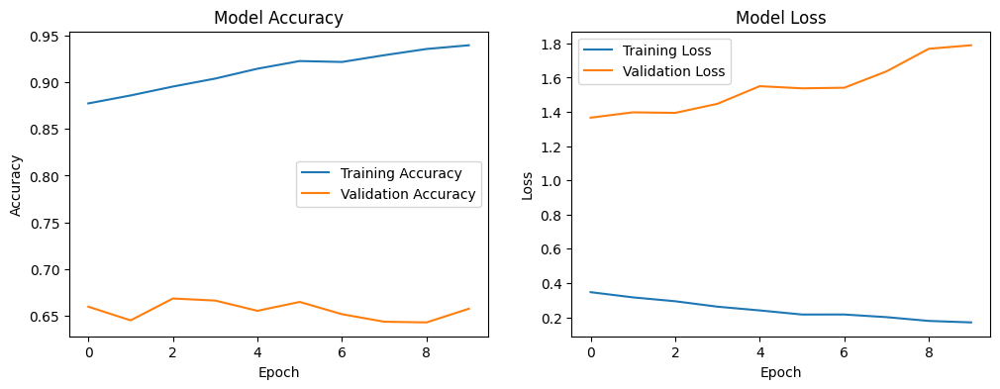

In [ ]:
# Plot Accuracy and Loss

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.show()

**EXPLANATION**

This graph shows the model accuracy and loss during training. In the left graph, training accuracy increases from around 87% to 90%, while validation accuracy stays around 65 to 67%. In the right graph, training loss decreases continuously, but validation loss increases. This indicates that the model is learning the training data well, but there is some overfitting on the validation data.”

# **TASK 13**

**MODEL EVALUATION**

In [ ]:
# Evaluate the CNN Model

test_loss, test_accuracy = model.evaluate(
    validation_generator
)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

43/43 ━━━━━━━━━━━━━━━━━━━━ 12s 269ms/step - accuracy: 0.6571 - loss: 1.7890
Test Loss: 1.7889560461044312
Test Accuracy: 0.6571428775787354


**EXPLANATION**

The trained CNN model is evaluated using the validation data to measure its loss and accuracy.

# **TASK 14**

**CONFUSION MATRIX**

43/43 ━━━━━━━━━━━━━━━━━━━━ 12s 272ms/step


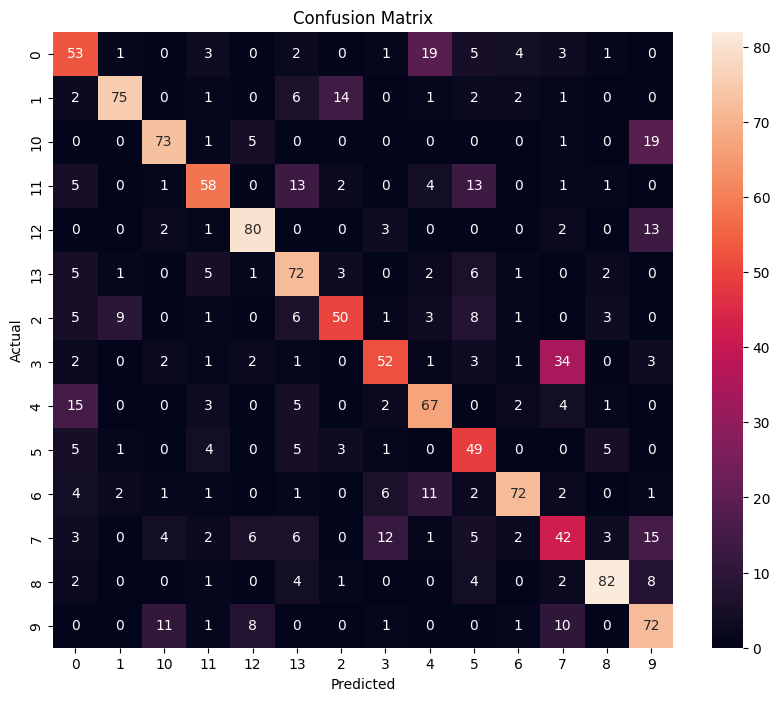

In [ ]:
# Confusion Matrix

import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

validation_generator.reset()

predictions = model.predict(validation_generator)
y_pred = np.argmax(predictions, axis=1)
y_true = validation_generator.classes

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=validation_generator.class_indices.keys(),
    yticklabels=validation_generator.class_indices.keys()
)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

**EXPLANATION**

The confusion matrix shows how correctly the CNN classifies each flower category.

# **TASK 15**

**CLASSIFICATION REPORT**

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(
    y_true,
    y_pred,
    target_names=list(validation_generator.class_indices.keys())
))

              precision    recall  f1-score   support

           0       0.52      0.58      0.55        92
           1       0.84      0.72      0.78       104
          10       0.78      0.74      0.76        99
          11       0.70      0.59      0.64        98
          12       0.78      0.79      0.79       101
          13       0.60      0.73      0.66        98
           2       0.68      0.57      0.62        87
           3       0.66      0.51      0.57       102
           4       0.61      0.68      0.64        99
           5       0.51      0.67      0.58        73
           6       0.84      0.70      0.76       103
           7       0.41      0.42      0.41       101
           8       0.84      0.79      0.81       104
           9       0.55      0.69      0.61       104

    accuracy                           0.66      1365
   macro avg       0.67      0.66      0.66      1365
weighted avg       0.67      0.66      0.66      1365



**EXPLANATION**


The classification report shows precision, recall, and F1-score for each flower class.

# **TASK 16**

**SAMPLE PREDICTION**

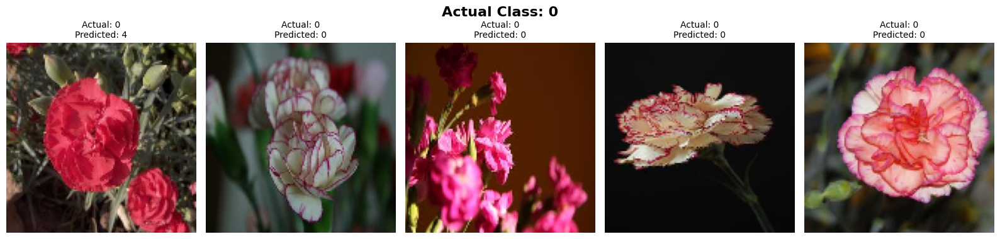

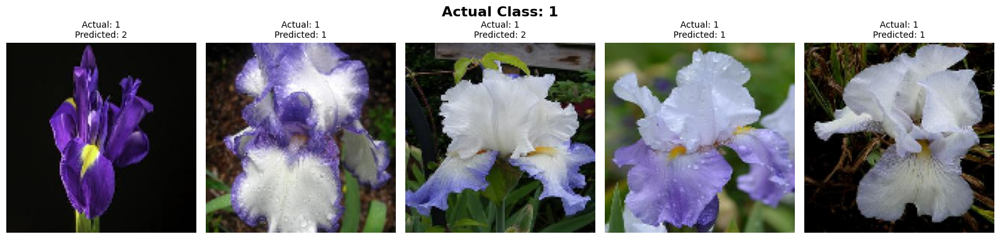

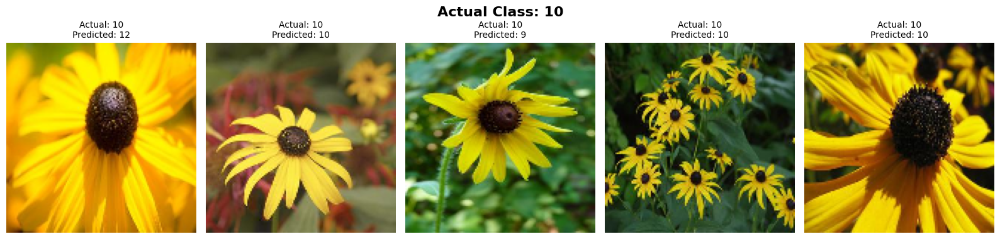

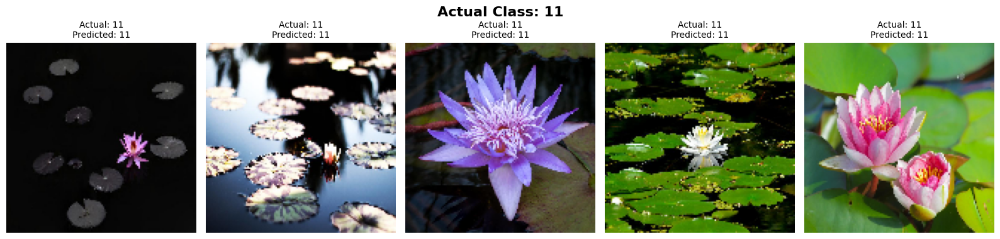

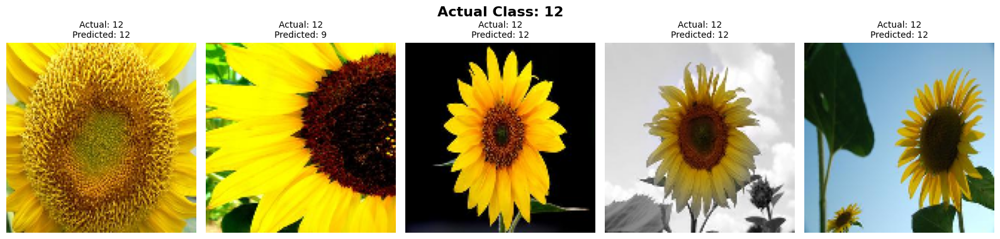

...

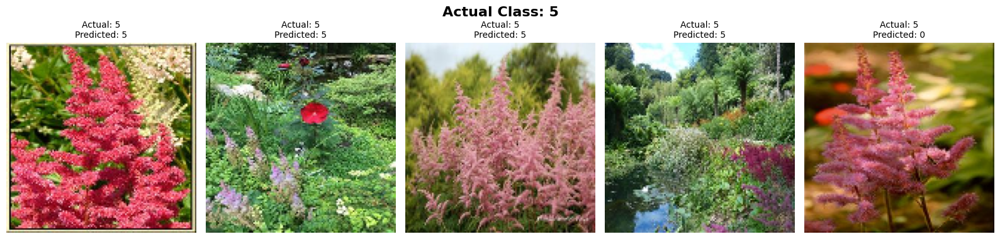

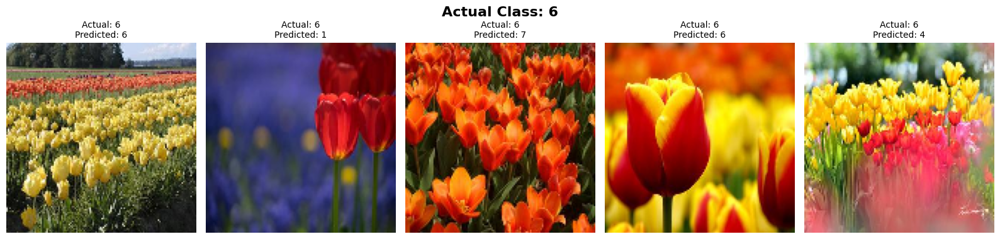

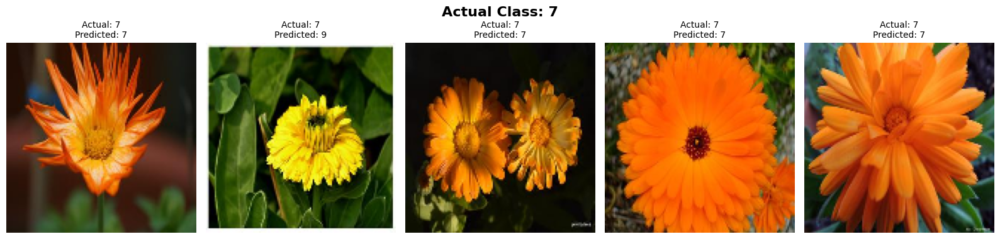

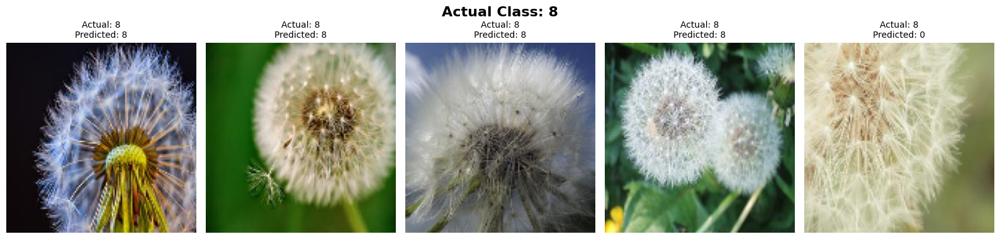

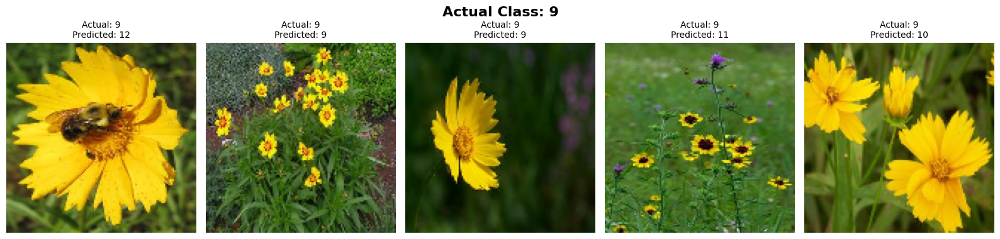

In [ ]:
# Actual vs Predicted - 5 Samples per Class

import numpy as np
import matplotlib.pyplot as plt

# Get class names in correct numeric order
class_indices = train_generator.class_indices

CLASS_NAMES = [
    name for name, index in sorted(
        class_indices.items(),
        key=lambda x: int(x[1])
    )
]

# Collect 5 samples for each class
samples = {i: [] for i in range(len(CLASS_NAMES))}

for batch_idx in range(len(validation_generator)):

    images, labels = validation_generator[batch_idx]
    predictions = model.predict(images, verbose=0)

    for j in range(len(images)):

        actual_class = np.argmax(labels[j])

        if len(samples[actual_class]) < 5:

            predicted_class = np.argmax(predictions[j])

            samples[actual_class].append(
                (images[j], predicted_class)
            )

    if all(len(samples[i]) == 5 for i in samples):
        break


# Display 5 samples for every class
for class_id, class_name in enumerate(CLASS_NAMES):

    fig, axes = plt.subplots(1, 5, figsize=(16, 4))

    fig.suptitle(
        f"Actual Class: {class_name}",
        fontsize=16,
        fontweight="bold"
    )

    for j in range(5):

        image, predicted_class = samples[class_id][j]

        axes[j].imshow(image)

        axes[j].set_title(
            f"Actual: {class_name}\n"
            f"Predicted: {CLASS_NAMES[predicted_class]}",
            fontsize=10
        )

        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

**CONCLUSION**

In this project, a CNN model was developed to classify flower images into 14 different classes. The images were preprocessed, trained using a CNN, and evaluated using accuracy, loss, confusion matrix, classification report, and sample predictions. The results show that the model can learn flower features and classify the images effectively